**Paquetes**

In [ ]:
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
from keras.models import Sequential
from keras.layers import Embedding, LSTM, Dense, GlobalAveragePooling1D, Dropout
from tensorflow.keras.preprocessing.text import Tokenizer
from keras.preprocessing.sequence import pad_sequences
from tensorflow import keras
import os
import tensorflow as tf

import unicodedata
import re
from google.colab import drive

from wordcloud import WordCloud
import matplotlib.pyplot as plt
from collections import Counter
from sklearn.metrics import confusion_matrix
import seaborn as sns

Sincronizar con el drive:

Los datos se ponen en una misma carpeta, luego se importaron cada uno por separado y se unen en un sólo df que contiene todas las observaciones

In [ ]:
drive.mount('/content/drive')


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
path = '/content/drive/MyDrive/Proyecto2CD'
print(os.listdir(path))

['non_clickbait_data', 'clickbait_data']


**Carga de los datos**

In [ ]:
file_path = '/content/drive/MyDrive/Proyecto2CD/clickbait_data'

with open(file_path, 'r', encoding='utf-8') as f:
    clickbait = [line.strip() for line in f if line.strip()]


In [ ]:
print(clickbait[:5])

['Should I Get Bings', 'Which TV Female Friend Group Do You Belong In', 'The New "Star Wars: The Force Awakens" Trailer Is Here To Give You Chills', 'This Vine Of New York On "Celebrity Big Brother" Is Fucking Perfect', 'A Couple Did A Stunning Photo Shoot With Their Baby After Learning She Had An Inoperable Brain Tumor']


**Pasar a df:**

In [ ]:
labels = [1] * len(clickbait)  # Todas con etiqueta 1

# Crear el DataFrame
df_clickbait = pd.DataFrame({
    'text': clickbait,
    'label': labels
})

# Verificar
print(df_clickbait.head())
print(len(df_clickbait))

                                                text  label
0                                 Should I Get Bings      1
1      Which TV Female Friend Group Do You Belong In      1
2  The New "Star Wars: The Force Awakens" Trailer...      1
3  This Vine Of New York On "Celebrity Big Brothe...      1
4  A Couple Did A Stunning Photo Shoot With Their...      1
15999


**Hacer todo lo mismo con non_clickbait:**

In [ ]:
file_path = '/content/drive/MyDrive/Proyecto2CD/non_clickbait_data'

with open(file_path, 'r', encoding='utf-8') as f:
    no_clickbait = [line.strip() for line in f if line.strip()]

In [ ]:
print(no_clickbait[:5])

['Bill Changing Credit Card Rules Is Sent to Obama With Gun Measure Included', 'In Hollywood, the Easy-Money Generation Toughens Up', "1700 runners still unaccounted for in UK's Lake District following flood", 'Yankees Pitchers Trade Fielding Drills for Putting Practice', 'Large earthquake rattles Indonesia; Seventh in two days']


In [ ]:
labels = [0] * len(no_clickbait)  # Todas con etiqueta 0

# Crear el DataFrame
df_no_clickbait = pd.DataFrame({
    'text': no_clickbait,
    'label': labels
})

# Verificar
print(df_no_clickbait.head())
print(len(df_no_clickbait))

                                                text  label
0  Bill Changing Credit Card Rules Is Sent to Oba...      0
1  In Hollywood, the Easy-Money Generation Toughe...      0
2  1700 runners still unaccounted for in UK's Lak...      0
3  Yankees Pitchers Trade Fielding Drills for Put...      0
4  Large earthquake rattles Indonesia; Seventh in...      0
16001


**Juntarlos en un sólo df:**

In [ ]:
# Concatenar ambos
df_total = pd.concat([df_clickbait, df_no_clickbait], ignore_index=True)
df_total = df_total.sample(frac=1, random_state=42).reset_index(drop=True)
print(df_total.head())
print(df_total['label'].value_counts())


                                                text  label
0  Filipino activist arrested for disrupting Mani...      0
1  International Board fixes soccer field size, h...      0
2      24 Rules For Women On A First Date With A Man      1
3  Political fallout from the sacking of Professo...      0
4  Which "Clueless" Character Are You Based On Yo...      1
label
0    16001
1    15999
Name: count, dtype: int64


In [ ]:
#Vemos cuál es la oración más larga que tenemos en df_total:

largos = df_total['text'].apply(lambda x: len(x.split()))
print(largos.max())
print(largos.min())

26
1


In [ ]:
label = df_total['label'].tolist()


**Hacer un word cloud (antes de pre-procesar):**

(np.float64(-0.5), np.float64(799.5), np.float64(399.5), np.float64(-0.5))

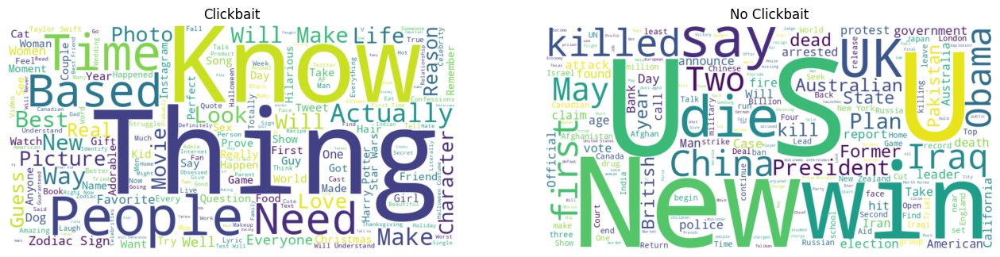

In [ ]:
# Texto combinado por clase
text_clickbait = ' '.join(df_total[df_total['label'] == 1]['text'])
text_non_clickbait = ' '.join(df_total[df_total['label'] == 0]['text'])

# Crear nubes
wc_clickbait = WordCloud(width=800, height=400, background_color='white').generate(text_clickbait)
wc_non_clickbait = WordCloud(width=800, height=400, background_color='white').generate(text_non_clickbait)

# Mostrar
plt.figure(figsize=(16, 8))
plt.subplot(1, 2, 1)
plt.imshow(wc_clickbait, interpolation='bilinear')
plt.title('Clickbait')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(wc_non_clickbait, interpolation='bilinear')
plt.title('No Clickbait')
plt.axis('off')


Ver el total de tipos que hay (vocabulario):

In [ ]:
vocabulario = set()

for texto in df_total['text']:
    palabras = texto.split()
    vocabulario.update(palabras)

print(len(vocabulario))

35859


**Pre-procesamiento:**

*Separación en Training, Validation y Testing:*

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(df_total["text"], df_total["label"], test_size=0.3, random_state=1234, stratify=df_total["label"])
X_val, X_test, y_val, y_test = train_test_split(X_test, y_test, test_size=0.5, random_state=1234, stratify=y_test)

print(len(y_train), len(y_val), len(y_test)) #Se tienen 22400 oraciones para entrenar y 4800 para validar y testear, de la misma cantidad para cada uno

22400 4800 4800


*Preparación del texto:*

1. Definir tamaño del vocabulario (cantidad de types máximos)
2. Dejar algunas observaciones para poder ver con LIME luego
3. Tokenizar
4. Hacer padding para que todas queden de entrada 26

In [ ]:
#Tokenizar:
maximo_palabras = 15000
largo_maximo = 26
tokenizer = Tokenizer(num_words=maximo_palabras)
tokenizer.fit_on_texts(X_train)

#Dejamos 6 observaciones para verlas con LIME luego:
X_test_LIME = X_test[:6]

X_train = tokenizer.texts_to_sequences(X_train)
X_test = tokenizer.texts_to_sequences(X_test)
X_val = tokenizer.texts_to_sequences(X_val)

#Hacemos el padding para que todas queden igual de 26:
X_train = pad_sequences(X_train, maxlen=largo_maximo)
X_test = pad_sequences(X_test, maxlen=largo_maximo)
X_val = pad_sequences(X_val, maxlen=largo_maximo)

print(X_test.shape)

(4800, 26)


**MLP**

Primero se intenta entrenar con BoW para ver la diferencia en rendimiento:

In [ ]:
def create_bow_matrix(sequences, vocab_size):
    bow_matrix = np.zeros((len(sequences), vocab_size))

    for i, seq in enumerate(sequences):
        for idx in seq:
            if idx < vocab_size:        # filtramos palabras fuera del vocabulario
                bow_matrix[i, idx - 1] += 1

    return bow_matrix

vocab_size = maximo_palabras  # usar mismo límite del tokenizer

X_train_bow = create_bow_matrix(X_train, vocab_size)
X_val_bow   = create_bow_matrix(X_val, vocab_size)
X_test_bow  = create_bow_matrix(X_test, vocab_size)



Modelo MLP:

In [ ]:
model = Sequential()
model.add(Dense(64, activation='relu', input_shape=(vocab_size,)))
model.add(Dense(32, activation='relu'))
model.add(Dropout(0.5))
model.add(Dense(32, activation='relu'))
model.add(Dense(1, activation='sigmoid'))

model.summary()


/usr/local/lib/python3.12/dist-packages/keras/src/layers/core/dense.py:93: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense (Dense)                   │ (None, 64)             │       960,064 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 32)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3 (Dense)                 │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 963,233 (3.67 MB)

 Trainable params: 963,233 (3.67 MB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/8
700/700 ━━━━━━━━━━━━━━━━━━━━ 7s 6ms/step - accuracy: 0.8525 - loss: 0.3098 - val_accuracy: 0.9777 - val_loss: 0.0626
Epoch 2/8
700/700 ━━━━━━━━━━━━━━━━━━━━ 10s 14ms/step - accuracy: 0.9888 - loss: 0.0366 - val_accuracy: 0.9792 - val_loss: 0.0675
Epoch 3/8
700/700 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - accuracy: 0.9966 - loss: 0.0126 - val_accuracy: 0.9721 - val_loss: 0.1029
Epoch 4/8
700/700 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - accuracy: 0.9979 - loss: 0.0075 - val_accuracy: 0.9558 - val_loss: 0.1994
Epoch 5/8
700/700 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - accuracy: 0.9978 - loss: 0.0072 - val_accuracy: 0.9729 - val_loss: 0.1102
Epoch 6/8
700/700 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - accuracy: 0.9992 - loss: 0.0035 - val_accuracy: 0.9704 - val_loss: 0.1450
Epoch 7/8
700/700 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - accuracy: 0.9996 - loss: 0.0016 - val_accuracy: 0.9754 - val_loss: 0.1338
Epoch 8/8
700/700 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - accuracy: 0.9993 - loss: 0.0022 - val_accuracy: 0.9702 -

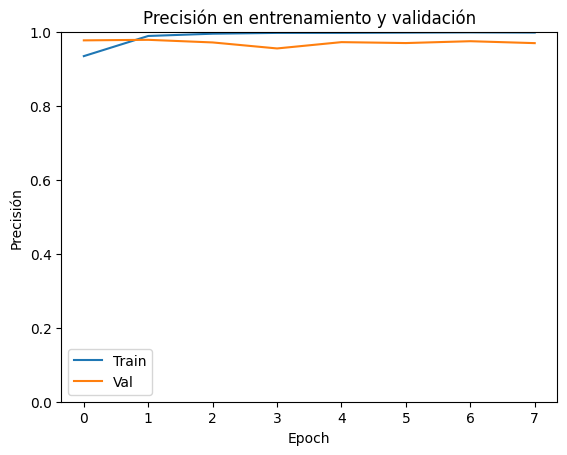

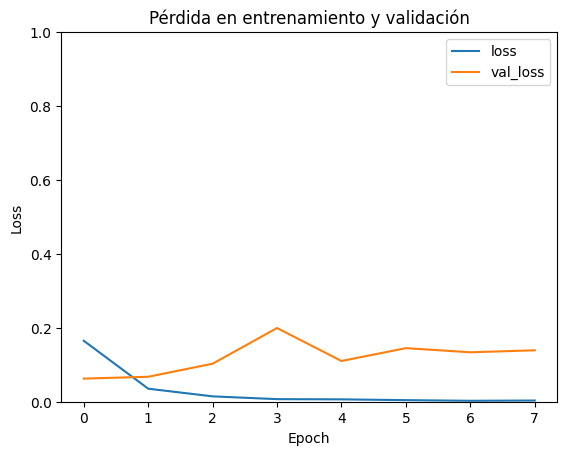

In [ ]:
model.compile(
    optimizer='adam',
    loss='binary_crossentropy',
    metrics=['accuracy']
)

history = model.fit(
    X_train_bow,
    y_train,
    epochs=8,
    batch_size=32,
    validation_data=(X_val_bow, y_val),
    verbose=1
)

plt.plot(history.history['accuracy'], label='Train')
plt.plot(history.history['val_accuracy'], label='Val')
plt.title('Precisión en entrenamiento y validación')
plt.ylabel('Precisión')
plt.xlabel('Epoch')
plt.ylim([0,1])
plt.legend()
plt.show()

plt.plot(history.history['loss'], label='loss')
plt.plot(history.history['val_loss'], label = 'val_loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.ylim([0,1])
plt.title('Pérdida en entrenamiento y validación')
plt.legend()
plt.show()


Evaluar con testeo:

150/150 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.9707 - loss: 0.1505
Test Accuracy: 0.9691666960716248
150/150 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step


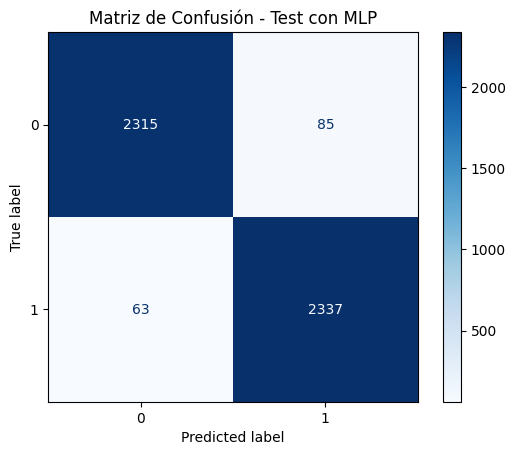

In [ ]:
test_loss, test_acc = model.evaluate(X_test_bow, y_test)
print("Test Accuracy:", test_acc)

y_pred_prob = model.predict(X_test_bow)
y_pred = (y_pred_prob >= 0.5).astype(int)

cm = confusion_matrix(y_test, y_pred)

disp = ConfusionMatrixDisplay(confusion_matrix=cm)
disp.plot(cmap='Blues')
plt.title("Matriz de Confusión - Test con MLP")
plt.show()

**RNN**

In [ ]:
model_rnn = Sequential([
    Embedding(input_dim=maximo_palabras, output_dim=64), #embedding desde cero
    tf.keras.layers.SimpleRNN(4, return_sequences=False),
    Dropout(0.2),
    Dense(32, activation='relu'),
    Dense(1, activation='sigmoid')
])

model_rnn.summary()

Model: "sequential_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ embedding (Embedding)           │ ?                      │   0 (unbuilt) │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ simple_rnn (SimpleRNN)          │ ?                      │   0 (unbuilt) │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ ?                      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4 (Dense)                 │ ?                      │   0 (unbuilt) │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5 (Dense)                 │ ?                      │   0 (unbuilt) │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 0 (0.00 B)

 Trainable params: 0 (0.00 B)

 Non-trainable params: 0 (0.00 B)

In [ ]:
from tensorflow.keras.callbacks import EarlyStopping
from tensorflow.keras.metrics import AUC

optimizer = tf.keras.optimizers.Adam(learning_rate=0.0001)
model_rnn.compile(optimizer=optimizer, loss='binary_crossentropy', metrics=['accuracy', 'precision',AUC(name='auc')])

early_stop = EarlyStopping(
    monitor=('val_loss'),
    patience=3,
    restore_best_weights=True
)

In [ ]:
# Train the model
history = model_rnn.fit(
    X_train, y_train,
    epochs=20,
    batch_size=32,
    validation_data=(X_val, y_val),
    callbacks=[early_stop]
)

Epoch 1/20
700/700 ━━━━━━━━━━━━━━━━━━━━ 9s 8ms/step - accuracy: 0.6276 - auc: 0.7425 - loss: 0.6466 - precision: 0.5919 - val_accuracy: 0.9446 - val_auc: 0.9901 - val_loss: 0.3726 - val_precision: 0.9772
Epoch 2/20
700/700 ━━━━━━━━━━━━━━━━━━━━ 4s 5ms/step - accuracy: 0.9505 - auc: 0.9804 - loss: 0.3262 - precision: 0.9636 - val_accuracy: 0.9640 - val_auc: 0.9936 - val_loss: 0.1758 - val_precision: 0.9806
Epoch 3/20
700/700 ━━━━━━━━━━━━━━━━━━━━ 4s 5ms/step - accuracy: 0.9696 - auc: 0.9917 - loss: 0.1711 - precision: 0.9799 - val_accuracy: 0.9706 - val_auc: 0.9946 - val_loss: 0.1135 - val_precision: 0.9772
Epoch 4/20
700/700 ━━━━━━━━━━━━━━━━━━━━ 4s 6ms/step - accuracy: 0.9787 - auc: 0.9952 - loss: 0.1063 - precision: 0.9831 - val_accuracy: 0.9621 - val_auc: 0.9949 - val_loss: 0.1089 - val_precision: 0.9894
Epoch 5/20
700/700 ━━━━━━━━━━━━━━━━━━━━ 4s 5ms/step - accuracy: 0.9865 - auc: 0.9975 - loss: 0.0696 - precision: 0.9889 - val_accuracy: 0.9723 - val_auc: 0.9955 - val_loss: 0.0825 - va

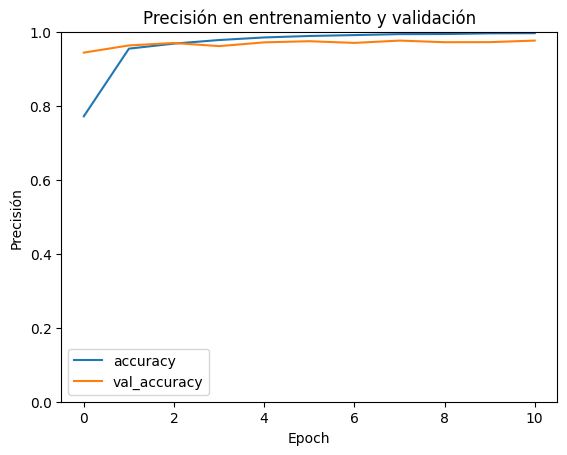

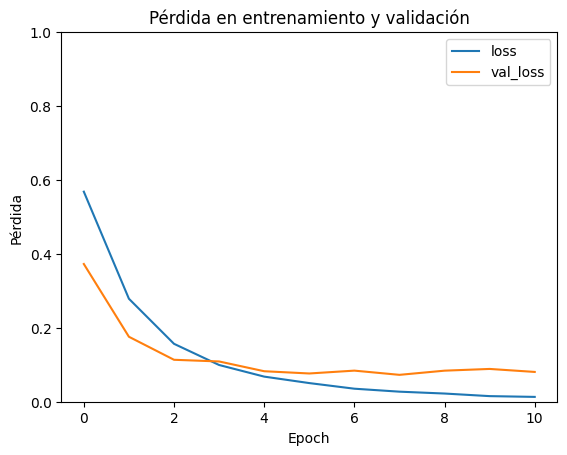

In [ ]:
# Gráficos de entrenamiento
plt.plot(history.history['accuracy'], label='accuracy')
plt.plot(history.history['val_accuracy'], label = 'val_accuracy')
plt.xlabel('Epoch')
plt.ylabel('Precisión')
plt.ylim([0,1])
plt.title('Precisión en entrenamiento y validación')
plt.legend()
plt.show()


plt.plot(history.history['loss'], label='loss')
plt.plot(history.history['val_loss'], label = 'val_loss')
plt.xlabel('Epoch')
plt.ylabel('Pérdida')
plt.ylim([0,1])
plt.title('Pérdida en entrenamiento y validación')
plt.legend()
plt.show()

In [ ]:
loss, accuracy, auc, precision = model_rnn.evaluate(X_test, y_test, verbose=0)
print(f"Test Accuracy: {accuracy:.4f}, Loss {loss:.4f}, AUC: {auc:.4f}, precision: {precision:.4f}")

Test Accuracy: 0.9700, Loss 0.0882, AUC: 0.9712, precision: 0.9954


150/150 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step


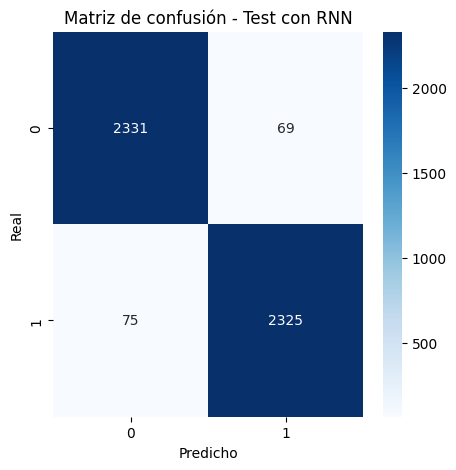

In [ ]:
y_pred = model_rnn.predict(X_test)
y_pred = (y_pred > 0.5).astype(int).flatten()
# Confusion matrix
cm = confusion_matrix(y_test, y_pred)


# Plot confusion matrix using seaborn
plt.figure(figsize=(5, 5))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues')
plt.xlabel('Predicho')
plt.ylabel('Real')
plt.title('Matriz de confusión - Test con RNN')
plt.show()

In [ ]:
# Mostrar algunos ejemplos del conjunto de prueba
num_ejemplos = 5  # Puedes cambiarlo

y_pred_proba = model_rnn.predict(X_test[:num_ejemplos])
y_pred_bin = (y_pred_proba > 0.5).astype(int).flatten()

for i in range(num_ejemplos):
    print("======")
    print(f"Observación {i}")

    # Reconstruir el texto original (opcional)
    secuencia = X_test[i]
    palabras_inv = {v: k for k, v in tokenizer.word_index.items()}
    texto_original = " ".join([palabras_inv.get(t, "") for t in secuencia if t != 0])

    print("Texto:")
    print(texto_original)

    print("\nPredicción (probabilidad):", y_pred_proba[i][0])
    print("Predicción (0/1):", y_pred_bin[i])
    print("Etiqueta real:", y_test.iloc[i])

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 473ms/step
Observación 0
Texto:
this is the easiest way to have eggs and toast for breakfast

Predicción (probabilidad): 0.9991479
Predicción (0/1): 1
Etiqueta real: 1
Observación 1
Texto:
in a run for the world cup south africa struggles

Predicción (probabilidad): 0.03781678
Predicción (0/1): 0
Etiqueta real: 0
Observación 2
Texto:
how well do you know the first episode of buffy

Predicción (probabilidad): 0.999062
Predicción (0/1): 1
Etiqueta real: 1
Observación 3
Texto:
17 people who've been personally by their gps

Predicción (probabilidad): 0.9966305
Predicción (0/1): 1
Etiqueta real: 1
Observación 4
Texto:
what sex move should you try on your man tonight

Predicción (probabilidad): 0.9993593
Predicción (0/1): 1
Etiqueta real: 1


 **Transformers preentrenado BERT**

In [ ]:
from transformers import AutoModelForSequenceClassification
#Cargar modelo BERT

id2label = {0: "no_clickbait", 1: "clickbait"}
label2id = {"no_clickbait": 0, "clickbait": 1}

model = AutoModelForSequenceClassification.from_pretrained(
    "bert-base-uncased",
    num_labels=2,
    problem_type="single_label_classification",
    id2label=id2label,
    label2id=label2id
)

for name, param in model.named_parameters():
    print(name, param.requires_grad)


/usr/local/lib/python3.12/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


config.json:   0%|          | 0.00/570 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/440M [00:00<?, ?B/s]

Some weights of BertForSequenceClassification were not initialized from the model checkpoint at bert-base-uncased and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


bert.embeddings.word_embeddings.weight True
bert.embeddings.position_embeddings.weight True
bert.embeddings.token_type_embeddings.weight True
bert.embeddings.LayerNorm.weight True
bert.embeddings.LayerNorm.bias True
bert.encoder.layer.0.attention.self.query.weight True
bert.encoder.layer.0.attention.self.query.bias True
bert.encoder.layer.0.attention.self.key.weight True
bert.encoder.layer.0.attention.self.key.bias True
bert.encoder.layer.0.attention.self.value.weight True
bert.encoder.layer.0.attention.self.value.bias True
bert.encoder.layer.0.attention.output.dense.weight True
bert.encoder.layer.0.attention.output.dense.bias True
bert.encoder.layer.0.attention.output.LayerNorm.weight True
bert.encoder.layer.0.attention.output.LayerNorm.bias True
bert.encoder.layer.0.intermediate.dense.weight True
bert.encoder.layer.0.intermediate.dense.bias True
bert.encoder.layer.0.output.dense.weight True
bert.encoder.layer.0.output.dense.bias True
bert.encoder.layer.0.output.LayerNorm.weight True


In [ ]:
# Asegurar que todos los textos sean strings válidos
X_train = [str(x) if x is not None else "" for x in X_train]
X_val   = [str(x) if x is not None else "" for x in X_val]
X_test  = [str(x) if x is not None else "" for x in X_test]

# Asegurar que las etiquetas sean INT
y_train = y_train.astype(int)
y_val   = y_val.astype(int)
y_test  = y_test.astype(int)
y_test = y_test.astype(int)

In [ ]:
from datasets import Dataset, DatasetDict
train_ds = Dataset.from_dict({"text": X_train, "label": y_train.tolist()})
val_ds   = Dataset.from_dict({"text": X_val,   "label": y_val.tolist()})
test_ds  = Dataset.from_dict({"text": X_test,  "label": y_test.tolist()})

In [ ]:
#Tokenizar específico para BERT
from transformers import AutoTokenizer
tokenizer = AutoTokenizer.from_pretrained("bert-base-uncased")
def tokenize(batch):
    return tokenizer(
        batch["text"],
        truncation=True,
        padding="max_length",
        max_length=64
    )


tokenizer_config.json:   0%|          | 0.00/48.0 [00:00<?, ?B/s]

vocab.txt:   0%|          | 0.00/232k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/466k [00:00<?, ?B/s]

In [ ]:
train_ds = train_ds.map(tokenize, batched=True)
val_ds   = val_ds.map(tokenize, batched=True)
test_ds  = test_ds.map(tokenize, batched=True)
train_ds = train_ds.remove_columns(["text"])
val_ds   = val_ds.remove_columns(["text"])
test_ds  = test_ds.remove_columns(["text"])
train_ds.set_format("torch")
val_ds.set_format("torch")
test_ds.set_format("torch")

Map:   0%|          | 0/22400 [00:00<?, ? examples/s]

Map:   0%|          | 0/4800 [00:00<?, ? examples/s]

Map:   0%|          | 0/4800 [00:00<?, ? examples/s]

In [ ]:
from transformers import TrainingArguments
#Argumentos de entrenamiento
metric_name = "accuracy"
batch_size = 16

args = TrainingArguments(
    output_dir="bert-clickbait",
    eval_strategy="epoch",
    save_strategy="epoch",
    logging_strategy="epoch",
    learning_rate=2e-5,
    per_device_train_batch_size=batch_size,
    per_device_eval_batch_size=batch_size,
    num_train_epochs=3,
    weight_decay=0.01,
    metric_for_best_model=metric_name,
    load_best_model_at_end=True,
    report_to="none",
)


In [ ]:
from sklearn.metrics import accuracy_score, f1_score
import numpy as np

def compute_metrics(eval_pred):
    logits, labels = eval_pred
    preds = np.argmax(logits, axis=1)

    return {
        "accuracy": accuracy_score(labels, preds),
        "f1": f1_score(labels, preds, average="macro")
    }


In [ ]:
#Entrenar modelo
from transformers import Trainer

trainer = Trainer(
    model=model,
    args=args,
    train_dataset=train_ds,
    eval_dataset=val_ds,
    tokenizer=tokenizer,
    compute_metrics=compute_metrics,
)

trainer.train()


/tmp/ipython-input-3584256856.py:4: FutureWarning: `tokenizer` is deprecated and will be removed in version 5.0.0 for `Trainer.__init__`. Use `processing_class` instead.
  trainer = Trainer(


Epoch,Training Loss,Validation Loss,Accuracy,F1
1,0.115200,0.266452,0.949375,0.949369
2,0.068600,0.207866,0.957500,0.957496
3,0.045100,0.223881,0.960625,0.960623


TrainOutput(global_step=4200, training_loss=0.0762605957757859, metrics={'train_runtime': 967.5569, 'train_samples_per_second': 69.453, 'train_steps_per_second': 4.341, 'total_flos': 2210132865024000.0, 'train_loss': 0.0762605957757859, 'epoch': 3.0})

In [ ]:
trainer.state.log_history


[{'loss': 0.1152,
  'grad_norm': 0.1558471918106079,
  'learning_rate': 1.3338095238095239e-05,
  'epoch': 1.0,
  'step': 1400},
 {'eval_loss': 0.2664518356323242,
  'eval_accuracy': 0.949375,
  'eval_f1': 0.9493688271282728,
  'eval_runtime': 18.298,
  'eval_samples_per_second': 262.323,
  'eval_steps_per_second': 16.395,
  'epoch': 1.0,
  'step': 1400},
 {'loss': 0.0686,
  'grad_norm': 13.203596115112305,
  'learning_rate': 6.671428571428572e-06,
  'epoch': 2.0,
  'step': 2800},
 {'eval_loss': 0.2078663408756256,
  'eval_accuracy': 0.9575,
  'eval_f1': 0.9574957495749574,
  'eval_runtime': 18.2242,
  'eval_samples_per_second': 263.387,
  'eval_steps_per_second': 16.462,
  'epoch': 2.0,
  'step': 2800},
 {'loss': 0.0451,
  'grad_norm': 0.004148904699832201,
  'learning_rate': 4.761904761904762e-09,
  'epoch': 3.0,
  'step': 4200},
 {'eval_loss': 0.22388134896755219,
  'eval_accuracy': 0.960625,
  'eval_f1': 0.9606231388280462,
  'eval_runtime': 18.2369,
  'eval_samples_per_second': 26

In [ ]:
import matplotlib.pyplot as plt
# Extraer historial
log = trainer.state.log_history

train_loss = []
eval_loss = []
eval_acc = []
epochs = []

for entry in log:
    # Train loss
    if "loss" in entry and "epoch" in entry:
        train_loss.append(entry["loss"])

    # Eval metrics
    if "eval_loss" in entry:
        eval_loss.append(entry["eval_loss"])
        eval_acc.append(entry["eval_accuracy"])
        epochs.append(entry["epoch"])

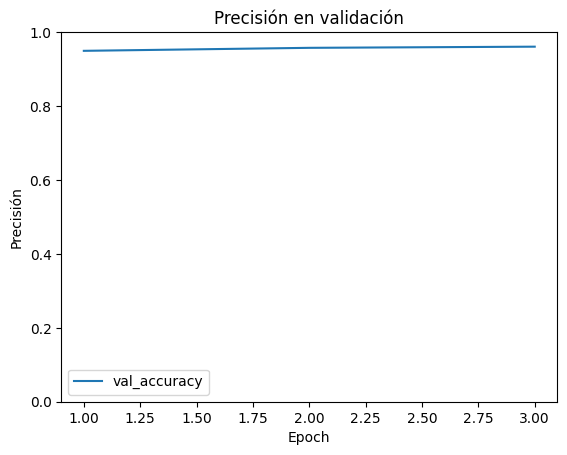

In [ ]:
import matplotlib.pyplot as plt

val_acc = [log["eval_accuracy"] for log in trainer.state.log_history if "eval_accuracy" in log]
plt.plot(range(1, len(val_acc)+1), val_acc, label="val_accuracy")

plt.xlabel("Epoch")
plt.ylabel("Precisión")
plt.title("Precisión en validación")
plt.ylim([0,1])
plt.legend()
plt.show()

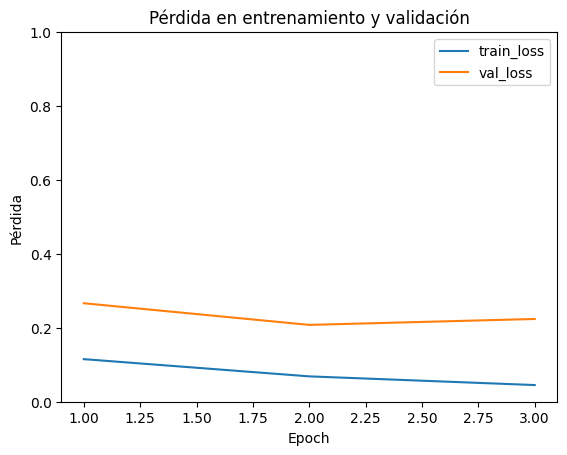

In [ ]:
import matplotlib.pyplot as plt

logs = trainer.state.log_history

train_loss = [x["loss"] for x in logs if "loss" in x and "epoch" in x]
val_loss   = [x["eval_loss"] for x in logs if "eval_loss" in x]

epochs_train = [x["epoch"] for x in logs if "loss" in x and "epoch" in x]
epochs_val   = [x["epoch"] for x in logs if "eval_loss" in x]

plt.plot(epochs_train, train_loss, label='train_loss')
plt.plot(epochs_val, val_loss, label='val_loss')

plt.xlabel("Epoch")
plt.ylabel("Pérdida")
plt.title("Pérdida en entrenamiento y validación")
plt.ylim([0,1])
plt.legend()
plt.show()

In [ ]:
from sklearn.metrics import accuracy_score, precision_score, roc_auc_score, confusion_matrix
import numpy as np
import torch

# Evaluación directa de HuggingFace (da loss + métricas definidas en compute_metrics)
test_results = trainer.evaluate(test_ds)
print(test_results)

{'eval_loss': 0.2769411504268646, 'eval_accuracy': 0.9508333333333333, 'eval_f1': 0.9508275624014206, 'eval_runtime': 18.8685, 'eval_samples_per_second': 254.392, 'eval_steps_per_second': 15.9, 'epoch': 3.0}


In [ ]:
pred_output = trainer.predict(test_ds)

logits = pred_output.predictions
y_true = test_ds["label"]

# Probabilidades con softmax
probs = torch.softmax(torch.tensor(logits), dim=1)[:,1].numpy()

# Clase predicha
y_pred = np.argmax(logits, axis=1)

#Métricas
acc  = accuracy_score(y_true, y_pred)
auc  = roc_auc_score(y_true, probs)

print(f"Test Accuracy: {acc:.4f}, AUC: {auc:.4f}, Loss: {test_results['eval_loss']:.4f}")

Test Accuracy: 0.9508, Precision: 0.9608, AUC: 0.9893, Loss: 0.2769


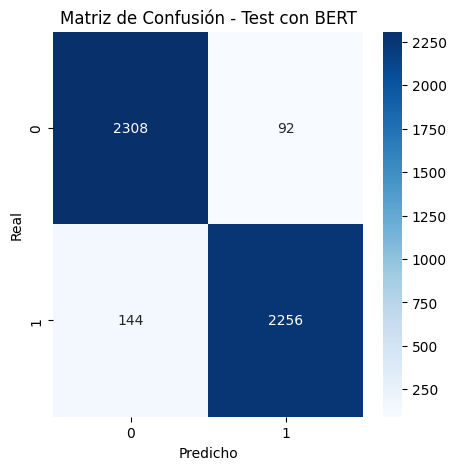

In [ ]:
#Matriz de confusión
import seaborn as sns
plt.figure(figsize=(5,5))
cm = confusion_matrix(y_true, y_pred)
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues")
plt.xlabel("Predicho")
plt.ylabel("Real")
plt.title("Matriz de Confusión - Test con BERT")
plt.show()

**LIME**

In [ ]:
!pip install lime

In [ ]:
from lime.lime_text import LimeTextExplainer


# 1) nombres de clase correctos (solo 2 strings)
class_names = ["No clickbait", "Clickbait"]

# Rename the BERT tokenizer to avoid conflict (assuming 'tokenizer' currently refers to the BERT tokenizer)
bert_tokenizer = tokenizer

# Re-create the Keras Tokenizer for the RNN model
# Note: This will fit on the entire df_total['text'] for simplicity, as the original raw X_train is not directly available.
k_tokenizer = Tokenizer(num_words=maximo_palabras)
k_tokenizer.fit_on_texts(df_total['text'])

# 2) función de predicción para LIME
def predict_proba_for_lime(texts):

    if isinstance(texts, str):
        texts = [texts]
    # Tokenizar + pad (igual que durante entrenamiento) using the Keras tokenizer
    seqs = k_tokenizer.texts_to_sequences(texts)
    seqs = pad_sequences(seqs, maxlen=largo_maximo)
    # Predecir con el modelo correcto
    probs_pos = model_rnn.predict(seqs)
    probs_pos = probs_pos.reshape(-1)

    probs = np.vstack([1 - probs_pos, probs_pos]).T
    return probs

# 3) Crear el explainer con los nombres de clase
explainer = LimeTextExplainer(class_names=class_names)

# 4) Ver unas cuantas instancias (X_test_LIME debe contener texto crudo)
for i in range(6):
    texto_crudo = X_test_LIME.iloc[i]   # debe ser string
    # obtener la predicción de probabilidad para esta muestra (opcional)
    probs = predict_proba_for_lime(texto_crudo)
    pred_clase = np.argmax(probs, axis=1)[0]
    # imprimir información útil
    print(f"Texto {i+1}:\n{texto_crudo}\n")
    # y_test puede ser Series o array de 0/1
    true_label = y_test.iloc[i] if hasattr(y_test, "iloc") else y_test[i]
    print(f"Etiqueta real: {true_label} ({class_names[int(true_label)]})")
    print(f"Predicción (clase): {pred_clase} ({class_names[pred_clase]})")
    print(f"Probabilidades: {probs}\n")

    # Generar explicación (explain_instance espera texto crudo)
    explanation = explainer.explain_instance(
        texto_crudo,
        predict_proba_for_lime,
        num_features=10,
        top_labels=2
    )
    # Mostrar dentro del notebook
    explanation.show_in_notebook(text=True)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 163ms/step
Texto 1:
This Is The Easiest Way To Have Eggs And Toast For Breakfast

Etiqueta real: 1 (Clickbait)
Predicción (clase): 1 (Clickbait)
Probabilidades: [[0.00381738 0.9961826 ]]

157/157 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 221ms/step
Texto 2:
In a Dry Run for the World Cup, South Africa Struggles

Etiqueta real: 0 (No clickbait)
Predicción (clase): 0 (No clickbait)
Probabilidades: [[0.5225575  0.47744253]]

157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step
Texto 3:
How Well Do You Know The First Episode Of "Buffy"

Etiqueta real: 1 (Clickbait)
Predicción (clase): 1 (Clickbait)
Probabilidades: [[0.00489891 0.9951011 ]]

157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 201ms/step
Texto 4:
17 People Who've Been Personally Victimized By Their GPS

Etiqueta real: 1 (Clickbait)
Predicción (clase): 1 (Clickbait)
Probabilidades: [[7.702112e-04 9.992298e-01]]

157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 397ms/step
Texto 5:
What Sex Move Should You Try On Your Man Tonight

Etiqueta real: 1 (Clickbait)
Predicción (clase): 1 (Clickbait)
Probabilidades: [[0.00211138 0.9978886 ]]

157/157 ━━━━━━━━━━━━━━━━━━━━ 2s 10ms/step


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 223ms/step
Texto 6:
Net Income Fell in Quarter for AT&T

Etiqueta real: 0 (No clickbait)
Predicción (clase): 0 (No clickbait)
Probabilidades: [[0.9946873  0.00531271]]

157/157 ━━━━━━━━━━━━━━━━━━━━ 2s 9ms/step
